<center><h1><b>VODAFONE PROJECT</b></h1></center>

# Data Understanding

Дано датасет <b>Vodafone Music</b> та опис колонок у файлі <b>Feature_dictionary.xlsx</b>

<b><i>Таргет</i></b><br>
Бінарна ознака, що приймає значення:<br>
1 --- користувачі, які протягом місяця від дати скорингу вперше встановили та оплатили перший місяць користування додатком Vodafone Music.<br>
0 --- користувачі, які ніколи не користувалися Vodafone Music, а також не встановили його протягом місяця від дати скорингу, але характеристики їхнього пристрою дають змогу їм користуватися цим додатком.

<b><i>Дані</i></b><br>
Надані вибірки містять дані про абонентів, які характеризують користування послугами оператора. Дані поділяються на три типи: характеристики абонента на певний момент часу (дата скорингу), деякі статистики за попередній місяць і помісячні агрегати. Агрегати розраховані як сума/кількість подій у попередньому місяці від дати скорингу (назви колонок мають суфікс m1), за позаминулий місяць (m2) і за третій місяць (m3).

Усі змінні у вибірках поділяються на тематичні категорії:

Device characteristics --- інформація про пристрій абонента

General characteristics --- інформація про абонента на момент дати скорингу. Здебільшого сюди входять різні бінарні змінні, які характеризують користування сервісами оператора, приналежність до спеціального тарифного плану, стан блокування тощо.

User activity features --- стан балансу на день скорингу, к-ть днів з останнього поповнення рахунку, загальна к-ть днів без мережевих подій

All costs --- інформація пов'язана зі списанням коштів з абонента за місяць. Загальні списання (в домашній мережі, в роумінгу), списання за смс, списання за абонентську плату

Recharge Statistics --- інформація про поповнення рахунку за місяць (сума, кількість поповнень різними способами)

Voice costs --- інформація про списання за дзвінки (всередині мережі, на мережі конкурентів, у роумінгу тощо) за місяць

Voice duration --- інформація про загальну тривалість дзвінків різних типів за місяць

Network Action Stats --- кількість мережевих подій за місяць

Other Essential Features --- статистика користування іншими сервісами, зокрема дата-трафіком за місяць

SMS from Services --- кількість вхідних смс від різних сервісів за минулий місяць

Interests Data --- кількість відвіданих сайтів певної категорії, а також користування деякими додатками (к-ть заходів і к-то переданих байт) за минулий місяць

Previous Campaigns Results --- участь абонента в акціях від оператора різного типу (за півроку)

<b>Завдання:</b> зробити розвідувальний аналіз та побудувати модель машинного навчання для визначення, чи підпишеться абонент на послугу Music

# Data Cleaning

Щоб "Почистити" дані, треба прибрати якомога більше пропусків та виправити (за потреби) некоректні дані.

In [222]:
#імпортуємо необхідні бібліотеки
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [223]:
#зчитуємо дані в датафрейм
df = pd.read_csv('vodafone_music_subset.csv')

In [224]:
#виводимо перші 5 рядки
df.head()

,device_type,manufacturer_category,os_category,sim_count,tp_flag,lt,block_flag,days_exp,service_1_flag,service_1_count,...,service_6_count_m3,service_7_cost_m3,service_7_flag_m3,service_8_count_m3,income_brnd_cont_m3,data_type_1_m3,data_type_2_m3,data_type_3_m3,service_9_flag_m3,target
0,7,1057,3,2.0,0,0.965306,0,153.0,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,48.779990,NaN,0
1,7,728,3,1.0,0,0.964468,0,354.0,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0
2,7,896,26,1.0,0,0.646706,0,60.0,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,0
3,7,745,3,2.0,0,0.842123,0,252.0,1.0,22.0,...,0.0,0.0,0.0,0.0,NaN,NaN,3104.715068,2890.028280,NaN,1
4,7,69,27,1.0,1,0.988695,0,333.0,0.0,0.0,...,0.0,0.0,0.0,0.0,NaN,NaN,0.822502,41.871067,NaN,0


In [225]:
#загальна статистика за стовпцями
df.describe()

,device_type,manufacturer_category,os_category,sim_count,tp_flag,lt,block_flag,days_exp,service_1_flag,service_1_count,...,service_6_count_m3,service_7_cost_m3,service_7_flag_m3,service_8_count_m3,income_brnd_cont_m3,data_type_1_m3,data_type_2_m3,data_type_3_m3,service_9_flag_m3,target
count,17500.000000,17500.000000,17500.000000,17324.000000,17500.000000,17500.000000,17500.000000,17498.000000,17498.000000,17498.000000,...,17498.000000,16397.000000,16397.000000,16397.0,2395.000000,1958.000000,11106.000000,12506.000000,914.0,17500.000000
mean,6.527486,889.620343,7.707429,1.607077,0.082286,0.791303,0.026400,317.100297,0.420562,249.294662,...,0.048005,0.322695,0.062572,0.0,17.788837,2306.071964,2759.596256,349.099211,1.0,0.076571
std,1.205635,492.099227,9.554743,0.489712,0.274807,0.155717,0.160326,80.530500,0.493663,445.107595,...,0.330541,2.310302,0.395742,0.0,122.884898,5635.640218,6254.465128,955.910697,0.0,0.265918
min,1.000000,1.000000,1.000000,1.000000,0.000000,0.201879,0.000000,-87.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,0.337300,0.000175,0.000050,0.000031,1.0,0.000000
25%,7.000000,592.000000,3.000000,1.000000,0.000000,0.701102,0.000000,324.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,2.745100,52.930055,119.562842,4.504177,1.0,0.000000
50%,7.000000,896.000000,3.000000,2.000000,0.000000,0.834245,0.000000,345.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.0,8.235300,466.405416,643.236568,56.340131,1.0,0.000000
75%,7.000000,1057.000000,3.000000,2.000000,0.000000,0.919868,0.000000,356.000000,1.000000,387.000000,...,0.000000,0.000000,0.000000,0.0,19.196250,2012.986153,2432.466967,284.797059,1.0,0.000000
max,8.000000,1836.000000,28.000000,3.000000,1.000000,1.000000,1.000000,824.000000,1.000000,10760.000000,...,19.000000,68.385400,4.000000,0.0,5925.716500,68556.908527,107707.651547,25739.826267,1.0,1.000000


In [226]:
df.dtypes

device_type                int64
manufacturer_category      int64
os_category                int64
sim_count                float64
tp_flag                    int64
                          ...   
data_type_1_m3           float64
data_type_2_m3           float64
data_type_3_m3           float64
service_9_flag_m3        float64
target                     int64
Length: 460, dtype: object

In [227]:
#розмір датафрейму 
df.shape

(17500, 460)

Бачимо, що датасет містить 460 колонок, тобто 459 фіч та 17500 рядків. 

Подивимося на пропущенні значення.

In [228]:
#кількість пропущених значень за стовпцями
df.isna().sum()

device_type                  0
manufacturer_category        0
os_category                  0
sim_count                  176
tp_flag                      0
                         ...  
data_type_1_m3           15542
data_type_2_m3            6394
data_type_3_m3            4994
service_9_flag_m3        16586
target                       0
Length: 460, dtype: int64

In [229]:
#кількість пропущених значень за стовпцями у відсотках
(df.isna().sum() / len(df)).round(4) * 100

device_type               0.00
manufacturer_category     0.00
os_category               0.00
sim_count                 1.01
tp_flag                   0.00
                         ...  
data_type_1_m3           88.81
data_type_2_m3           36.54
data_type_3_m3           28.54
service_9_flag_m3        94.78
target                    0.00
Length: 460, dtype: float64

In [43]:
#для візуалізації пропущених значень завантажимо модудь missingno
! pip install missingno

  Using cached missingno-0.5.2-py3-none-any.whl (8.7 kB)


In [7]:
import missingno as msno

<Axes: >

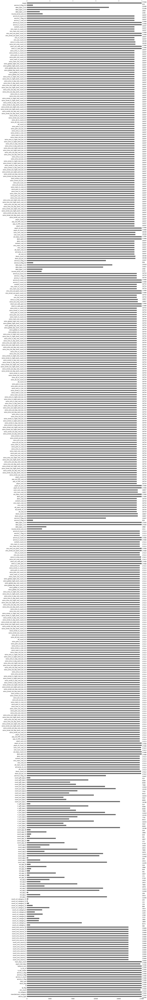

In [8]:
#візуалізація пропущених значень
msno.bar(df)

Пропусків дуже багато, тому ми можемо видалити колонки та рядки, в яких більше 50% пропущених значень. А також видалимо стовпчики з константою.

In [230]:
#Подивимось на стовпчики зі 50% пропущених значень
drop_col = []
for col in df.columns:
    if df[col].isna().sum() / len(df) * 100 > 0.5:
        drop_col.append(col)
drop_col

['sim_count',
 'paym_last_days',
 'count_sms_source_1',
 'count_sms_source_2',
 'count_sms_source_3',
 'count_sms_source_4',
 'count_sms_source_5',
 'count_sms_source_6',
 'count_sms_source_7',
 'count_sms_source_8',
 'count_sms_source_9',
 'count_sms_source_10',
 'count_sms_source_11',
 'count_sms_source_12',
 'count_sms_source_13',
 'count_sms_source_14',
 'count_sms_source_15',
 'count_sms_source_16',
 'count_url_category_1',
 'count_url_category_2',
 'count_url_category_3',
 'count_url_category_4',
 'count_url_category_6',
 'count_url_category_7',
 'count_url_category_8',
 'count_url_category_9',
 'count_url_category_10',
 'count_url_category_11',
 'count_url_category_12',
 'count_url_category_13',
 'count_url_category_15',
 'vol_app_1',
 'vol_app_2',
 'vol_app_3',
 'vol_app_4',
 'vol_app_5',
 'vol_app_6',
 'vol_app_7',
 'vol_app_8',
 'vol_app_9',
 'vol_app_10',
 'vol_app_11',
 'vol_app_12',
 'vol_app_13',
 'vol_app_14',
 'vol_app_15',
 'vol_app_16',
 'count_app_1',
 'count_app_2',

In [231]:
#видалимо ці стовпчики
df = df.drop(columns = drop_col)

In [232]:
#Подивимось на стовпчики зі константою
drop_col = []
for col in df.columns:
    if df[col].max() == df[col].min():
        drop_col.append(col)
drop_col

['service_2_flag', 'inact_days_count']

In [233]:
#видалимо стовпчики з константою
df = df.drop(columns = drop_col) 

In [234]:
df.shape

(17500, 50)

In [235]:
#видалимо рядки, половина яких містить пропуски
c = df.shape[1]//2
df = df.dropna(thresh = c, axis = 0)
df.shape

(17498, 50)

In [236]:
#подивимось на пропуски
df.isna().sum()

device_type                     0
manufacturer_category           0
os_category                     0
tp_flag                         0
lt                              0
block_flag                      0
days_exp                        0
service_1_flag                  0
service_1_count                 0
service_3_flag                  0
is_obl_center                   0
is_my_vf                        0
balance_sum                     0
abon_part_m1                    0
act_days_count_m1               0
com_num_cost_m1                85
conn_com_cost_m1               85
paym_el_count_m1                0
paym_el_sum_m1                  0
short_in_calls_part_m1          0
short_out_calls_part_m1         0
voice_out_uniq_count_m1        85
voice_in_uniq_count_m1         85
sms_onnet_out_pack_count_m1     0
sms_omo_out_pack_count_m1       0
service_5_count_m1              0
service_6_count_m1              0
data_type_2_m1                  0
data_type_3_m1                  0
abon_part_m2  

Кількість колонок значно зменшилась, але є ще 4 колонки з пропусками, які ми можемо заповнити медіаним значенням або модою, в залежності від даних. Тому роздивимося детальніше ці 4 колонки

In [237]:
df['com_num_cost_m1'].describe()

count    17413.000000
mean         0.810348
std          0.865603
min          0.000000
25%          0.125000
50%          0.522374
75%          1.241667
max          7.000000
Name: com_num_cost_m1, dtype: float64

In [238]:
df['conn_com_cost_m1'].describe()

count    17413.000000
mean         0.516369
std          0.706219
min          0.000000
25%          0.033333
50%          0.226544
75%          0.712401
max          4.000000
Name: conn_com_cost_m1, dtype: float64

In [239]:
df['voice_out_uniq_count_m1'].describe()

count    17413.000000
mean        34.979096
std         37.324407
min          0.000000
25%          8.000000
50%         26.000000
75%         49.000000
max        649.000000
Name: voice_out_uniq_count_m1, dtype: float64

In [240]:
df['voice_in_uniq_count_m1'].describe()

count    17413.000000
mean        38.856027
std         41.680051
min          0.000000
25%         12.000000
50%         29.000000
75%         52.000000
max       1569.000000
Name: voice_in_uniq_count_m1, dtype: float64

Так як стовпчики com_num_cost_m1, conn_com_cost_m1 категоріальні і мають моду нуль, то можемо заповнити пропуски нулем. А стовпчики voice_out_uniq_count_m1, voice_in_uniq_count_m1 кількісні, тому заповнимо пропуски їх медіанним значенням.

In [241]:
df['com_num_cost_m1'].fillna(0, inplace = True)
df['conn_com_cost_m1'].fillna(0, inplace = True)
df['voice_out_uniq_count_m1'].fillna(df['voice_out_uniq_count_m1'].median(), inplace = True)
df['voice_in_uniq_count_m1'].fillna(df['voice_in_uniq_count_m1'].median(), inplace = True)

In [242]:
df.isna().sum()

device_type                    0
manufacturer_category          0
os_category                    0
tp_flag                        0
lt                             0
block_flag                     0
days_exp                       0
service_1_flag                 0
service_1_count                0
service_3_flag                 0
is_obl_center                  0
is_my_vf                       0
balance_sum                    0
abon_part_m1                   0
act_days_count_m1              0
com_num_cost_m1                0
conn_com_cost_m1               0
paym_el_count_m1               0
paym_el_sum_m1                 0
short_in_calls_part_m1         0
short_out_calls_part_m1        0
voice_out_uniq_count_m1        0
voice_in_uniq_count_m1         0
sms_onnet_out_pack_count_m1    0
sms_omo_out_pack_count_m1      0
service_5_count_m1             0
service_6_count_m1             0
data_type_2_m1                 0
data_type_3_m1                 0
abon_part_m2                   0
act_days_c

In [243]:
df.dtypes

device_type                      int64
manufacturer_category            int64
os_category                      int64
tp_flag                          int64
lt                             float64
block_flag                       int64
days_exp                       float64
service_1_flag                 float64
service_1_count                float64
service_3_flag                 float64
is_obl_center                    int64
is_my_vf                         int64
balance_sum                    float64
abon_part_m1                   float64
act_days_count_m1              float64
com_num_cost_m1                float64
conn_com_cost_m1               float64
paym_el_count_m1               float64
paym_el_sum_m1                 float64
short_in_calls_part_m1         float64
short_out_calls_part_m1        float64
voice_out_uniq_count_m1        float64
voice_in_uniq_count_m1         float64
sms_onnet_out_pack_count_m1    float64
sms_omo_out_pack_count_m1      float64
service_5_count_m1       

Більше пропусків немає і всі значення числові, а отже, ми 'очистили' наші дані.

# Exploratory Data Analysis (EDA)

Зробимо розвідувальний аналіз — це проста статистика, кореляційний аналіз, зведені таблиці, візуалізація. Це дасть нам змогу краще зрозуміти дані та виявити між ними якісь закономірності.

## Розподіл таргету

In [23]:
df['target'].describe()

count    17498.000000
mean         0.076580
std          0.265932
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: target, dtype: float64

In [20]:
df['target'].value_counts()

0    16158
1     1340
Name: target, dtype: int64

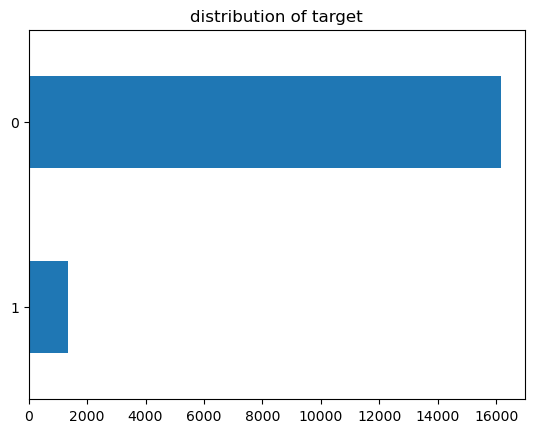

In [21]:
df['target'].value_counts().sort_values().plot(kind='barh')
plt.title('distribution of target')
plt.show()

Дані несбалансовані, адже значно більше користувачів, які не користувалися послугою Music.

## Розподіл фіч і таргету

In [21]:
df.head()

,device_type,manufacturer_category,os_category,tp_flag,lt,block_flag,days_exp,service_1_flag,service_1_count,service_3_flag,...,act_days_count_m3,paym_el_count_m3,paym_el_sum_m3,short_in_calls_part_m3,short_out_calls_part_m3,sms_onnet_out_pack_count_m3,sms_omo_out_pack_count_m3,service_5_count_m3,service_6_count_m3,target
0,7,1057,3,0,0.965306,0,153.0,0.0,0.0,0.0,...,28.0,0.0,0.00,0.018519,0.080370,0.0,0.0,0.0,0.0,0
1,7,728,3,0,0.964468,0,354.0,0.0,0.0,0.0,...,14.0,1.0,1.38,0.000000,0.020957,0.0,0.0,0.0,0.0,0
2,7,896,26,0,0.646706,0,60.0,0.0,0.0,0.0,...,4.0,0.0,0.00,0.000000,0.000000,0.0,0.0,0.0,0.0,0
3,7,745,3,0,0.842123,0,252.0,1.0,22.0,0.0,...,27.0,0.0,0.00,0.166667,0.000000,0.0,0.0,0.0,0.0,1
4,7,69,27,1,0.988695,0,333.0,0.0,0.0,0.0,...,4.0,0.0,0.00,0.000000,0.000000,0.0,0.0,0.0,0.0,0


In [22]:
df.columns

Index(['device_type', 'manufacturer_category', 'os_category', 'tp_flag', 'lt',
       'block_flag', 'days_exp', 'service_1_flag', 'service_1_count',
       'service_3_flag', 'is_obl_center', 'is_my_vf', 'balance_sum',
       'abon_part_m1', 'act_days_count_m1', 'com_num_cost_m1',
       'conn_com_cost_m1', 'paym_el_count_m1', 'paym_el_sum_m1',
       'short_in_calls_part_m1', 'short_out_calls_part_m1',
       'voice_out_uniq_count_m1', 'voice_in_uniq_count_m1',
       'sms_onnet_out_pack_count_m1', 'sms_omo_out_pack_count_m1',
       'service_5_count_m1', 'service_6_count_m1', 'data_type_2_m1',
       'data_type_3_m1', 'abon_part_m2', 'act_days_count_m2',
       'paym_el_count_m2', 'paym_el_sum_m2', 'short_in_calls_part_m2',
       'short_out_calls_part_m2', 'sms_onnet_out_pack_count_m2',
       'sms_omo_out_pack_count_m2', 'service_5_count_m2', 'service_6_count_m2',
       'abon_part_m3', 'act_days_count_m3', 'paym_el_count_m3',
       'paym_el_sum_m3', 'short_in_calls_part_m3', 'shor

In [32]:
df.describe()

,device_type,manufacturer_category,os_category,tp_flag,lt,block_flag,days_exp,service_1_flag,service_1_count,service_3_flag,...,act_days_count_m3,paym_el_count_m3,paym_el_sum_m3,short_in_calls_part_m3,short_out_calls_part_m3,sms_onnet_out_pack_count_m3,sms_omo_out_pack_count_m3,service_5_count_m3,service_6_count_m3,target
count,17498.000000,17498.000000,17498.000000,17498.000000,17498.000000,17498.000000,17498.000000,17498.000000,17498.000000,17498.000000,...,17498.000000,17498.000000,17498.000000,17498.000000,17498.000000,17498.000000,17498.000000,17498.000000,17498.000000,17498.000000
mean,6.527432,889.561264,7.707967,0.082295,0.791322,0.026403,317.100297,0.420562,249.294662,0.029089,...,22.840668,1.127386,61.166568,0.070253,0.069032,0.017431,0.001714,26.786604,0.048005,0.076580
std,1.205693,492.082132,9.555156,0.274822,0.155691,0.160335,80.530500,0.493663,445.107595,0.168061,...,7.655488,1.661313,116.692406,0.122908,0.121994,0.728336,0.081405,59.397327,0.330541,0.265932
min,1.000000,1.000000,1.000000,0.000000,0.201879,0.000000,-87.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000000,592.000000,3.000000,0.000000,0.701157,0.000000,324.000000,0.000000,0.000000,0.000000,...,20.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7.000000,896.000000,3.000000,0.000000,0.834245,0.000000,345.000000,0.000000,0.000000,0.000000,...,27.000000,1.000000,40.000000,0.038462,0.039368,0.000000,0.000000,0.000000,0.000000,0.000000
75%,7.000000,1057.000000,3.000000,0.000000,0.919868,0.000000,356.000000,1.000000,387.000000,0.000000,...,28.000000,2.000000,95.000000,0.091082,0.090909,0.000000,0.000000,39.000000,0.000000,0.000000
max,8.000000,1836.000000,28.000000,1.000000,1.000000,1.000000,824.000000,1.000000,10760.000000,1.000000,...,28.000000,32.000000,9231.950000,3.000000,3.000000,69.000000,6.000000,2265.000000,19.000000,1.000000


Подивимося на суму балансу на початку місяця користувачів.

In [28]:
df['balance_sum'].value_counts()

1.000000     108
0.000100      46
1.000101      36
0.000200      31
1.002225      26
            ... 
2.529922       1
0.583632       1
21.004186      1
6.585335       1
2.003203       1
Name: balance_sum, Length: 16933, dtype: int64

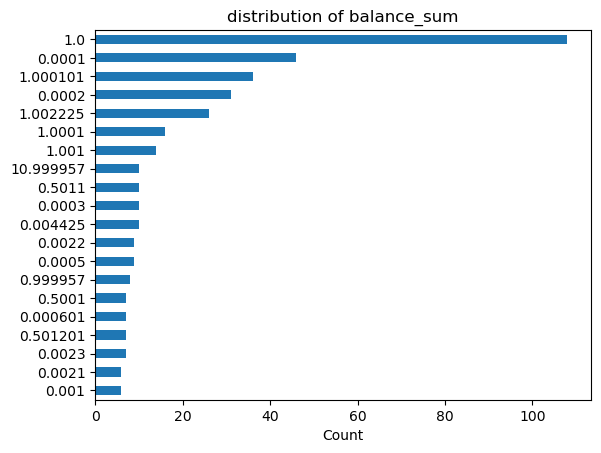

In [32]:
df['balance_sum'].value_counts().head(20).sort_values().plot(kind='barh')
plt.xlabel('Count')
plt.title('distribution of balance_sum')
plt.show()

In [57]:
#перевіримо залежність таргету від балансу на початку місяця
from scipy.stats import spearmanr
spearmanr(df['balance_sum'], df['target'])

SignificanceResult(statistic=-0.12503380022242647, pvalue=6.576345676354008e-62)

In [58]:
6.576345676354008e-62 <= 0.05

True

Тобто, у більшості користувачів на початку місяця сума баланс становить 1. Сума балансу та таргет-змінна мають статистично-значущий зв'язок.

Подивимося на тип дівайса користувачів.

In [59]:
df['device_type'].value_counts()

7    14319
4     2475
8      396
1      176
6       96
5       28
3        8
Name: device_type, dtype: int64

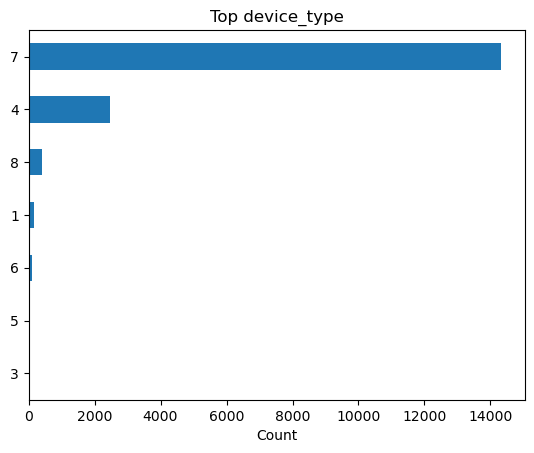

In [60]:
df['device_type'].value_counts().head(10).sort_values().plot(kind='barh')
plt.xlabel('Count')
plt.title('Top device_type')
plt.show()

In [61]:
#перевіримо залежність таргету від типу дівайса
from scipy.stats import spearmanr
spearmanr(df['device_type'], df['target'])

SignificanceResult(statistic=0.03281639709501155, pvalue=1.413121657010663e-05)

In [62]:
1.413121657010663e-05 <= 0.05

True

Тобто, тип дівайсу під номером 7 найпопулярніший. Тип дівайса та таргет-змінна мають статистично-значущий зв'язок.

Щоб подивитися як пов'язані стан тарифного плану та стан блокування подивимося на таблицю спряжності

In [22]:
pd.crosstab(df['tp_flag'], df['block_flag'])

block_flag,0,1
tp_flag,,
0,15610,448
1,1426,14


Таким чином, більшість користувачів мають тарифний план під номером 0 та не в стані блокування

Тепер за допомогою зведеної таблиці дізнаємося середнє значення суми електроних платежів користувачів, які підписані на Music та які не підписані.

In [23]:
df.pivot_table(values=['paym_el_sum_m1', 'paym_el_sum_m2', 'paym_el_sum_m3'], index=['target'], aggfunc='mean')

,paym_el_sum_m1,paym_el_sum_m2,paym_el_sum_m3
target,,,
0,65.526023,63.119788,60.707847
1,70.528410,64.787724,66.697925


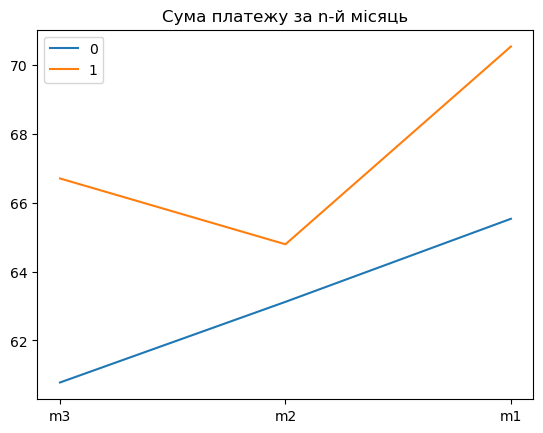

In [48]:
x = ['m3', 'm2', 'm1']
y1 = [60.78, 63.12, 65.53]
y2 = [66.7, 64.79, 70.53]
plt.plot(x, y1)
plt.plot(x, y2)
plt.legend(['0', '1'])
plt.title('Сума платежу за n-й місяць')
plt.show()

Це свідчить про те, що користувачі, які підписані на Music, в середньому платять більше. При цьому бачимо, що загалом сума платежів зростає лінійно по місяцям у користувачів, що не підписані на цю послугу.

Твкож порівняємо середнє значення кількості електроних платежів користувачів, які підписані на Music та які не підписані.

In [109]:
df.pivot_table(values=['paym_el_count_m1', 'paym_el_count_m2', 'paym_el_count_m3'], index=['target'], aggfunc='mean')

,paym_el_count_m1,paym_el_count_m2,paym_el_count_m3
target,,,
0,1.177002,1.146181,1.110162
1,1.422388,1.333582,1.335075


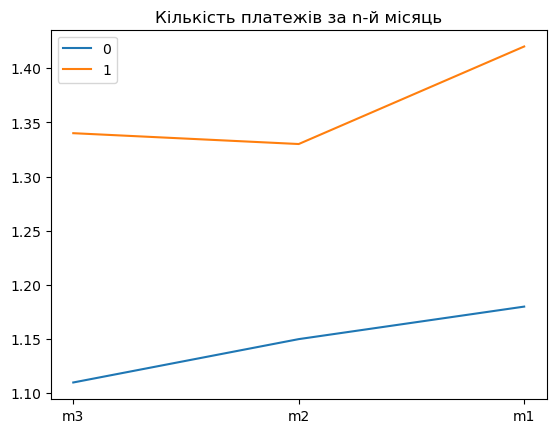

In [49]:
x = ['m3', 'm2', 'm1']
y1 = [1.11, 1.15, 1.18]
y2 = [1.34, 1.33, 1.42]
plt.plot(x, y1)
plt.plot(x, y2)
plt.legend(['0', '1'])
plt.title('Кількість платежів за n-й місяць')
plt.show()

Таким чином, користувачі, що підписані на на Music, платять загалом більше і частіше.

Перевіримо, як впливають відсотки ефективної та неефективної комунікації на таргет-зміну

In [33]:
df['com_num_cost_m1'].value_counts()

0.000000    3333
1.000000     360
0.500000     253
0.333333     166
0.250000     149
            ... 
0.254701       1
0.954401       1
1.005556       1
0.440948       1
1.482769       1
Name: com_num_cost_m1, Length: 8744, dtype: int64

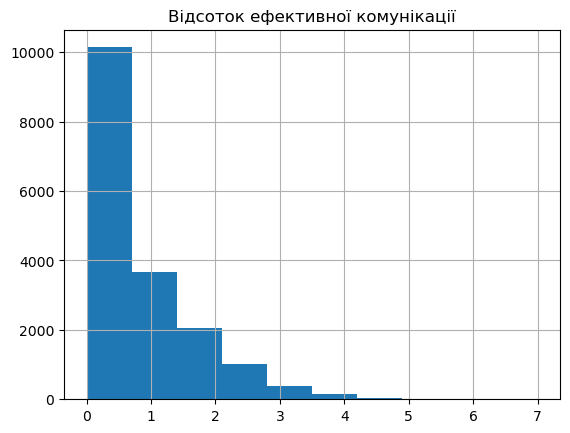

In [42]:
df['com_num_cost_m1'].hist()
plt.title('Відсоток ефективної комунікації')
plt.show()

In [34]:
df['conn_com_cost_m1'].value_counts()

0.000000    3333
1.000000     292
2.000000      88
0.500000      73
0.333333      63
            ... 
0.046277       1
0.307895       1
0.455061       1
0.279752       1
1.352713       1
Name: conn_com_cost_m1, Length: 11790, dtype: int64

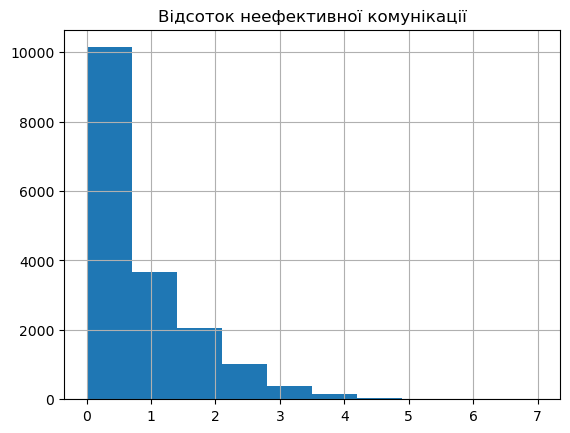

In [43]:
df['com_num_cost_m1'].hist()
plt.title('Відсоток неефективної комунікації')
plt.show()

In [38]:
#знайдемо середній відсоток ефективної комунікації
df.groupby('target')['com_num_cost_m1'].mean()

target
0    0.799835
1    0.885722
Name: com_num_cost_m1, dtype: float64

In [44]:
#перевіримо залежність таргету від %-ка ефективної комунікації
from scipy.stats import spearmanr
spearmanr(df['com_num_cost_m1'], df['target'])

SignificanceResult(statistic=0.005621072334653743, pvalue=0.45717403667917156)

In [45]:
0.45717403667917156 <= 0.05

False

In [39]:
#знайдемо середній відсоток неефективної комунікації
df.groupby('target')['conn_com_cost_m1'].mean()

target
0    0.508408
1    0.579618
Name: conn_com_cost_m1, dtype: float64

In [46]:
#перевіримо залежність таргету від %-ка неефективної комунікації
from scipy.stats import spearmanr
spearmanr(df['conn_com_cost_m1'], df['target'])

SignificanceResult(statistic=0.0009837678255434326, pvalue=0.8964686792465881)

In [47]:
0.8964686792465881 <= 0.05

False

Отже, відсоток ефективної комунікації та неефективної більше у користувачів, що підписані на послугу Music. Але статистичного зв'язку між цими фічами та таргетом немає.

Подивимося, як співвідносяться вихідні смс від Vodafone та вихідні смс від інших операторів.

In [51]:
df['sms_onnet_out_pack_count_m1'].value_counts()

0.0     17476
10.0        5
6.0         4
1.0         3
4.0         3
16.0        2
24.0        1
5.0         1
7.0         1
33.0        1
8.0         1
Name: sms_onnet_out_pack_count_m1, dtype: int64

In [63]:
#сума вихідних смс Vodafone
df.groupby('target')['sms_onnet_out_pack_count_m1'].sum()

target
0    168.0
1     30.0
Name: sms_onnet_out_pack_count_m1, dtype: float64

In [56]:
#сума вихідних смс інших операторів
df.groupby('target')['sms_omo_out_pack_count_m1'].sum()

target
0    42.0
1     0.0
Name: sms_omo_out_pack_count_m1, dtype: float64

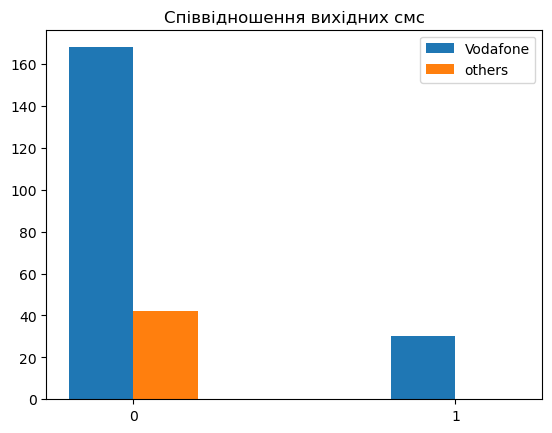

In [64]:
w = ['0', '1']
sum1 = [168, 30] #сума вихідних смс Vodafone
sum2 = [42, 0] #сума вихідних смс інших операторів
width = 0.2
x = np.arange(len(w))
fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, sum1, width, label='Vodafone')
rects2 = ax.bar(x + width/2, sum2, width, label='others')
ax.set_xticks(x)
ax.set_xticklabels(w)
ax.legend()
plt.title('Співвідношення вихідних смс')
plt.show()

In [65]:
#перевіримо залежність таргету від вихідних смс Vodafone
from scipy.stats import spearmanr
spearmanr(df['sms_onnet_out_pack_count_m1'], df['target'])

SignificanceResult(statistic=0.00798067874458892, pvalue=0.29113928914552906)

In [66]:
0.29113928914552906 <= 0.05

False

In [67]:
#перевіримо залежність таргету від вихідних смс інших операторів
from scipy.stats import spearmanr
spearmanr(df['sms_omo_out_pack_count_m1'], df['target'])

SignificanceResult(statistic=-0.0061589782628498225, pvalue=0.4152674105611228)

In [68]:
0.4152674105611228 <= 0.05

False

Отже, Vodafone відправляв більше смс користувачам, що не підписані на послугу Music. А інші оператори не відправляли смс користувачам, які підписані на цю послугу. Статистичний зв'язок між вихідними смс і таргетом не значущий.

In [69]:
df['voice_out_uniq_count_m1'].value_counts()

0.0      2100
1.0       490
26.0      301
2.0       300
3.0       278
         ... 
229.0       1
255.0       1
239.0       1
218.0       1
262.0       1
Name: voice_out_uniq_count_m1, Length: 263, dtype: int64

In [74]:
#сума унікальних вихідних дзвінків
df.groupby('target')['voice_out_uniq_count_m1'].sum()

target
0    569787.0
1     41514.0
Name: voice_out_uniq_count_m1, dtype: float64

In [75]:
#сума унікальних вхідних дзвінків
df.groupby('target')['voice_in_uniq_count_m1'].sum()

target
0    631595.0
1     47470.0
Name: voice_in_uniq_count_m1, dtype: float64

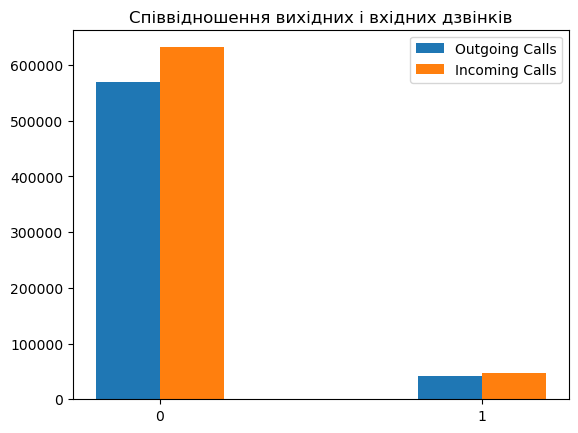

In [76]:
w = ['0', '1']
sum1 = [569787, 41514] #сума унікальних вихідних дзвінків
sum2 = [631595, 47470] #сума унікальних вхідних дзвінків
width = 0.2
x = np.arange(len(w))
fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, sum1, width, label='Outgoing Calls')
rects2 = ax.bar(x + width/2, sum2, width, label='Incoming Calls')
ax.set_xticks(x)
ax.set_xticklabels(w)
ax.legend()
plt.title('Співвідношення вихідних і вхідних дзвінків')
plt.show()

In [77]:
#перевіримо залежність таргету від вихідних дзвінків
from scipy.stats import spearmanr
spearmanr(df['voice_out_uniq_count_m1'], df['target'])

SignificanceResult(statistic=-0.037223053066109485, pvalue=8.426520577001002e-07)

In [78]:
8.426520577001002e-07 <= 0.05

True

In [79]:
#перевіримо залежність таргету від вхідних дзвінків
from scipy.stats import spearmanr
spearmanr(df['voice_in_uniq_count_m1'], df['target'])

SignificanceResult(statistic=-0.027792649878087973, pvalue=0.0002361230533788506)

In [80]:
0.0002361230533788506 <= 0.05

True

Отже, користувачі, що не підписані на Music, мають більше вхідних і вихідних дзвінків. Крім того, вхідні і вихідні дзвінки мають статистично-значущий зв'язок із таргетом.

## Кореляційний аналіз

Знайдемо кореляцію між змінними та таргетом, скориставшись коефіцієнтом кореляції Спірмана.

In [81]:
df.corr(method='spearman')[['target']].sort_values(by='target', ascending=False)

,target
target,1.000000
data_type_3_m1,0.047142
data_type_2_m1,0.045902
short_out_calls_part_m1,0.043927
device_type,0.032816
short_out_calls_part_m3,0.026386
short_in_calls_part_m1,0.026255
service_6_count_m1,0.024848
short_out_calls_part_m2,0.023715
service_6_count_m3,0.023128


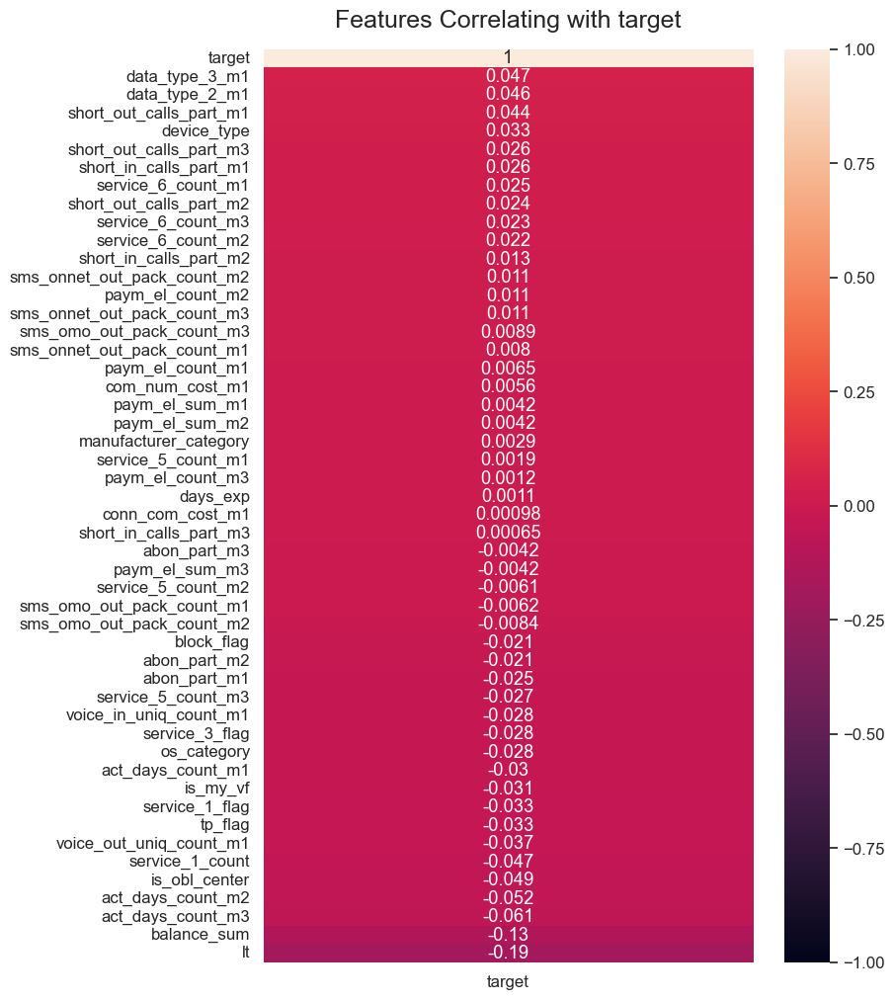

In [86]:
теплова карта кореляцій
plt.figure(figsize=(8, 12))
sns.set(font_scale=1.1)

heatmap = sns.heatmap(df.corr(method='spearman')[['target']].sort_values(by='target', ascending=False), vmin=-1, vmax=1, annot=True)

heatmap.set_title('Features Correlating with target', fontdict={'fontsize':18}, pad=16)
plt.show()

# KNN

Так як таргет в нас бінарна ознака, що приймає значення 0 та 1, то ми маємо задачу класифікації і будемо використовувати KNeighborsClassifier. Як метрику використаємо balanced_accuracy так, як дані несбалансовані.

In [294]:
#розіб'ємо дані на навчальну та валідаційну вибірки і застосуємо масштабування
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
X = df.drop('target', axis=1)
y = df['target']
scaler = StandardScaler()
X_st = scaler.fit_transform(X)
X_train, X_valid, y_train, y_valid = train_test_split(X_st, y, test_size=0.25, random_state=12)

In [295]:
#навчаємо модель класифікації при кідькості сусідів 7
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=7)

In [296]:
#перевірка якості моделі
y_pred = knn.predict(X_valid)
from sklearn.metrics import balanced_accuracy_score
print('Accuracy:', balanced_accuracy_score(y_valid, y_pred))

Accuracy: 0.507826830470086


Так як найкраща оцінка balanced_accuracy для моделі --- це 1, а найгірша --- 0, то наша модель має середню якість.

## Підбір гіперпараметрів

Спробуємо налаштувати оптимальну кількість найближчих сусідів.

In [297]:
#графік залежності метрики від кількості сусідів
acc = []
for k in range(1, 50, 2):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train, y_train)
    y_pred = knn.predict(X_valid)
    acc.append(balanced_accuracy_score(y_valid, y_pred))
print(acc)

[0.5297859845112742, 0.5148113872912948, 0.5179106506727837, 0.507826830470086, 0.5037814325760116, 0.5008867854476092, 0.4998754359740907, 0.49975087194818135, 0.4998754359740907, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5, 0.5]


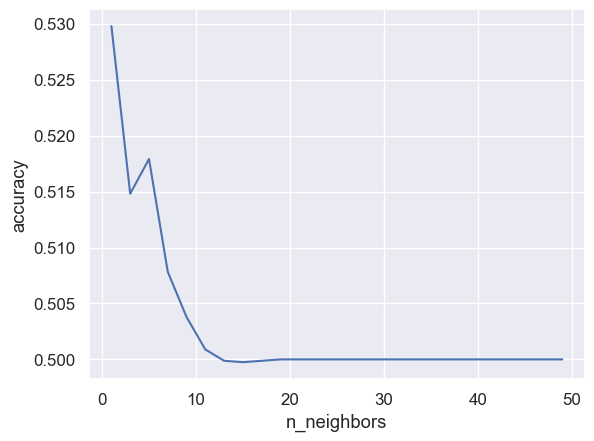

In [298]:
plt.plot(range(1, 50, 2), acc)
plt.xlabel('n_neighbors')
plt.ylabel('accuracy')
plt.show()

In [299]:
#крос-валідація
from sklearn.model_selection import GridSearchCV
knn = KNeighborsClassifier()
knn_grid = GridSearchCV(knn, {'n_neighbors': np.arange(1, 50, 2)}, cv=5, scoring='balanced_accuracy')
knn_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
       35, 37, 39, 41, 43, 45, 47, 49])},
             scoring='balanced_accuracy')

In [300]:
#найкраща кількість сусідів
knn_grid.best_params_

{'n_neighbors': 1}

In [301]:
knn_grid.best_score_

0.5305197021458382

In [302]:
#якість моделі при найкращій кількісті сусідів
best_knn = knn_grid.best_estimator_
y_pred = best_knn.predict(X_valid)
print(balanced_accuracy_score(y_valid, y_pred))

0.5297859845112742


In [303]:
#функція побудови валідаційної кривої
def validation_curve(model_grid, param_name, params=None):
    results_df = pd.DataFrame(model_grid.cv_results_)

    if params == None:
        plt.plot(results_df['param_'+param_name], results_df['mean_test_score'])
    else:
        plt.plot(params, results_df['mean_test_score'])
    plt.xlabel(param_name)
    plt.ylabel('score')
    plt.title('Validation curve')
    plt.show()

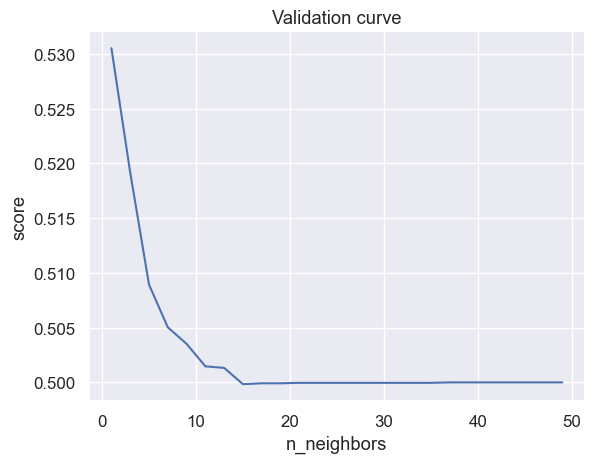

In [105]:
#побудова валідаційної кривої
validation_curve(knn_grid, 'n_neighbors', [i for i in range(1, 50, 2)])

Отже, оптимальна кількість сусідів для нашої моделі --- це 1. Якість моделі трішки покращилася.

Спробуємо тепер підібрати найкращу метрику.

In [304]:
#крос-валідація
from sklearn.model_selection import GridSearchCV
knn = KNeighborsClassifier(n_neighbors=41, weights='distance')
knn_grid = GridSearchCV(knn, {'p': np.linspace(1, 10, 20)}, cv=5, scoring='balanced_accuracy', n_jobs=-1)
knn_grid.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=KNeighborsClassifier(n_neighbors=41, weights='distance'),
             n_jobs=-1,
             param_grid={'p': array([ 1.        ,  1.47368421,  1.94736842,  2.42105263,  2.89473684,
        3.36842105,  3.84210526,  4.31578947,  4.78947368,  5.26315789,
        5.73684211,  6.21052632,  6.68421053,  7.15789474,  7.63157895,
        8.10526316,  8.57894737,  9.05263158,  9.52631579, 10.        ])},
             scoring='balanced_accuracy')

In [305]:
#найкращі показники
print('Best p:', knn_grid.best_params_)
print('\nBest score:', knn_grid.best_score_)

Best p: {'p': 1.0}

Best score: 0.5


In [306]:
#якість моделі при найкращих показниках
best_knn = knn_grid.best_estimator_
y_pred = best_knn.predict(X_valid)
print(balanced_accuracy_score(y_valid, y_pred))

0.5


Отже, оптимальна метрика для нашої моделі --- Манхетенська. Якість моделі залишилася такою ж.

Підберемо 2 гіперпараметри одночасно, а саме кількість сусідів і метрику

In [109]:
#крос-валідація
knn = KNeighborsClassifier(weights='distance')
knn_grid = GridSearchCV(knn, {'n_neighbors': np.arange(1, 50, 2), 'p': np.linspace(1, 4, 3)}, cv=5, scoring='accuracy', n_jobs=-1)
knn_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(weights='distance'),
             n_jobs=-1,
             param_grid={'n_neighbors': array([ 1,  3,  5,  7,  9, 11, 13, 15, 17, 19, 21, 23, 25, 27, 29, 31, 33,
       35, 37, 39, 41, 43, 45, 47, 49]),
                         'p': array([1. , 2.5, 4. ])},
             scoring='accuracy')

In [114]:
#найкращі показники
print('Best p:', knn_grid.best_params_)
print('\nBest score:', knn_grid.best_score_)

Best p: {'n_neighbors': 23, 'p': 1.0}

Best score: 0.9253981707317074


In [115]:
#якість моделі при найкращих показниках
best_knn = knn_grid.best_estimator_
y_pred = best_knn.predict(X_valid)
print(balanced_accuracy_score(y_valid, y_pred))

0.5


Тобто, при підборі 2 гіперпараметрів, ми отримали кількість сусідів 23 та Манхетенську метрику. Але якість моделі не змінилася. Найкраща якість моделі KNN становить 0.53

# Нейроні мережі та ансамблі моделей

Побудуємо багатошаровий перцептрон для класифікації

In [307]:
#навчаємо модель класифікації
from sklearn.neural_network import MLPClassifier
mlp = MLPClassifier(solver='lbfgs', max_iter=500)
mlp.fit(X_train, y_train)

MLPClassifier(max_iter=500, solver='lbfgs')

In [308]:
#якість моделі
from sklearn.metrics import precision_score, recall_score, f1_score
y_pred = mlp.predict(X_valid)
print('Precision:', precision_score(y_valid, y_pred))
print('Recall:', recall_score(y_valid, y_pred))
print('F1 score:', f1_score(y_valid, y_pred))
print('Balanced_accuracy', balanced_accuracy_score(y_valid, y_pred))

Precision: 0.18023255813953487
Recall: 0.17174515235457063
F1 score: 0.175886524822695
Balanced_accuracy 0.5507455208708578


In [309]:
#побудуємо матрицю помилок
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_valid, y_pred))

[[3732  282]
 [ 299   62]]


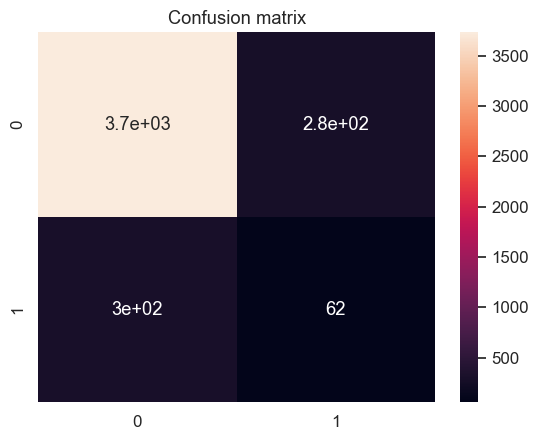

In [310]:
#візуалізуємо матрицю помилок
cm = confusion_matrix(y_valid, y_pred)
sns.heatmap(cm, annot=True)
plt.title('Confusion matrix')
plt.show()

Це означає, що модель невірно передбачила 299 одиничок та 282 нулів. Ми хочемо, щоб якомога більше користувачів підписались на послугу Music, тому будемо мінімізувати recall (щоб менше було помилково передбачених нулів).

## Підбір гіперпараметрів

Підберемо гіперпараметри нейронної мережі:
1) hidden_layer_sizes --- кількість прихованих шарів та нейронів
2) activation --- функція активації
3) learning_rate --- темп навчання

Підбір кількісті прихованих шарів та нейронів --- hidden_layer_sizes 

In [311]:
from sklearn.model_selection import GridSearchCV

param_grid = {'hidden_layer_sizes': [(100,), (100, 50), (100, 50, 20), (50, 50), (50, 50, 50), (50, 30, 30, 20)]}
model_grid = GridSearchCV(mlp, param_grid, cv=5, scoring='recall', n_jobs=-1)
model_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=MLPClassifier(max_iter=500, solver='lbfgs'),
             n_jobs=-1,
             param_grid={'hidden_layer_sizes': [(100,), (100, 50),
                                                (100, 50, 20), (50, 50),
                                                (50, 50, 50),
                                                (50, 30, 30, 20)]},
             scoring='recall')

In [312]:
#найкращі показники
print('Best hidden_layer_sizes:', model_grid.best_params_)
print('\nBest score:', model_grid.best_score_)

Best hidden_layer_sizes: {'hidden_layer_sizes': (100,)}

Best score: 0.18079016221873365


In [313]:
#якість моделі при найкращих показниках
model_best = model_grid.best_estimator_
y_pred = model_best.predict(X_valid)

print(confusion_matrix(y_valid, y_pred))
print('Recall:', recall_score(y_valid, y_pred))
print('Balanced_accuracy', balanced_accuracy_score(y_valid, y_pred))

[[3735  279]
 [ 298   63]]
Recall: 0.1745152354570637
Balanced_accuracy 0.5525042544998323


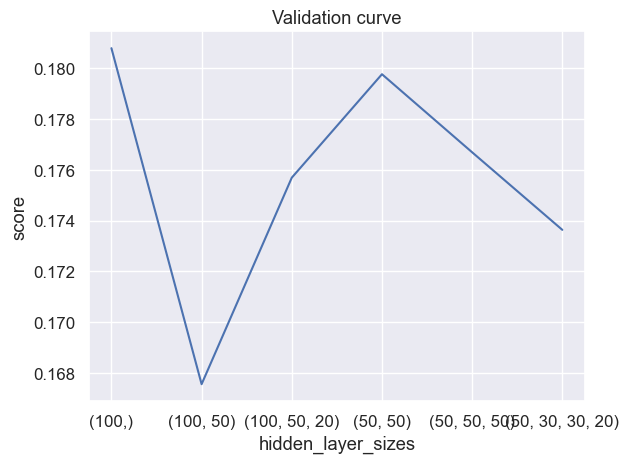

In [314]:
#валідаційна крива
hidden = [(100,), (100, 50), (100, 50, 20), (50, 50), (50, 50, 50), (50, 30, 30, 20)]
validation_curve(model_grid, 'hidden_layer_sizes', [str(x) for x in hidden])

Тобто найкраще підійде модель з одним прихованим шаром з кількості нейронів 100. Але якість моделі не покращилася.

Підбір функції активації --- activation

In [315]:
from sklearn.model_selection import GridSearchCV

param_grid = {'activation': ['logistic', 'tanh', 'relu']}
model_grid = GridSearchCV(mlp, param_grid, cv=5, scoring='recall', n_jobs=-1)
model_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=MLPClassifier(max_iter=500, solver='lbfgs'),
             n_jobs=-1, param_grid={'activation': ['logistic', 'tanh', 'relu']},
             scoring='recall')

In [316]:
#найкращі показники
print('Best hidden_layer_sizes:', model_grid.best_params_)
print('\nBest score:', model_grid.best_score_)

Best hidden_layer_sizes: {'activation': 'relu'}

Best score: 0.16549450549450548


In [317]:
#якість моделі при найкращих показниках
model_best = model_grid.best_estimator_
y_pred = model_best.predict(X_valid)

print(confusion_matrix(y_valid, y_pred))
print('Recall:', recall_score(y_valid, y_pred))
print('Balanced_accuracy', balanced_accuracy_score(y_valid, y_pred))

[[3730  284]
 [ 311   50]]
Recall: 0.13850415512465375
Balanced_accuracy 0.5338758942040807


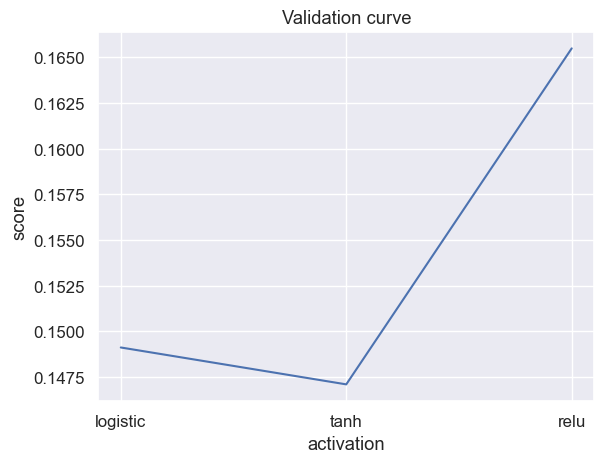

In [318]:
#валідаційна крива
validation_curve(model_grid, 'activation')

Тобто найкраще підійде модель з функцією активації $relu$, що має вигляд: $f(x) = max(0, x)$. Якість моделі тепер погіршилась.

Підбір темпу навчання --- learning_rate

In [319]:
from sklearn.model_selection import GridSearchCV

param_grid = {'learning_rate': ['constant', 'invscaling', 'adaptive']}
model_grid = GridSearchCV(mlp, param_grid, cv=5, scoring='recall', n_jobs=-1)
model_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=MLPClassifier(max_iter=500, solver='lbfgs'),
             n_jobs=-1,
             param_grid={'learning_rate': ['constant', 'invscaling',
                                           'adaptive']},
             scoring='recall')

In [320]:
#найкращі показники
print('Best params:', model_grid.best_params_)
print('\nBest score:', model_grid.best_score_)

Best hidden_layer_sizes: {'learning_rate': 'adaptive'}

Best score: 0.16241758241758245


In [321]:
#якість моделі при найкращих показниках
model_best = model_grid.best_estimator_
y_pred = model_best.predict(X_valid)

print(confusion_matrix(y_valid, y_pred))
print('Recall:', recall_score(y_valid, y_pred))
print('Balanced_accuracy', balanced_accuracy_score(y_valid, y_pred))

[[3739  275]
 [ 309   52]]
Recall: 0.1440443213296399
Balanced_accuracy 0.5377670535397576


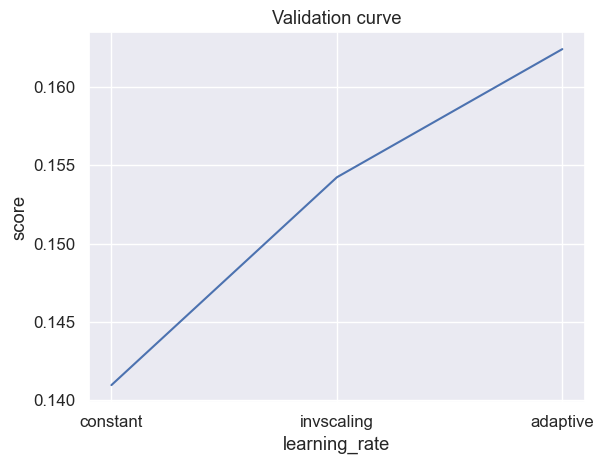

In [322]:
#валідаційна крива
validation_curve(model_grid, 'learning_rate')

Отже, найкраще підійде адаптивний темп навчання. Recall, як і в попередньому випадку, становить 0.14

Спробуємо підібрати декілька гіперпараметрів одночасно

In [325]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {'learning_rate': ['constant', 'invscaling', 'adaptive'], 'activation': ['logistic', 'tanh', 'relu'], 'hidden_layer_sizes': [(100,), (100, 50), (100, 50, 20), (50, 50), (50, 50, 50), (50, 30, 30, 20)]}
model_grid = RandomizedSearchCV(mlp, param_grid, cv=5, scoring='recall', n_jobs=-1)
model_grid.fit(X_train, y_train)

RandomizedSearchCV(cv=5, estimator=MLPClassifier(max_iter=500, solver='lbfgs'),
                   n_jobs=-1,
                   param_distributions={'activation': ['logistic', 'tanh',
                                                       'relu'],
                                        'hidden_layer_sizes': [(100,),
                                                               (100, 50),
                                                               (100, 50, 20),
                                                               (50, 50),
                                                               (50, 50, 50),
                                                               (50, 30, 30,
                                                                20)],
                                        'learning_rate': ['constant',
                                                          'invscaling',
                                                          'adaptive']},
                   scoring='recall')

In [326]:
#найкращі показники
print('Best params:', model_grid.best_params_)
print('\nBest score:', model_grid.best_score_)

Best params: {'learning_rate': 'constant', 'hidden_layer_sizes': (50, 30, 30, 20), 'activation': 'relu'}

Best score: 0.19403453689167977


In [327]:
#якість моделі при найкращих показниках
model_best = model_grid.best_estimator_
y_pred = model_best.predict(X_valid)

print(confusion_matrix(y_valid, y_pred))
print('Recall:', recall_score(y_valid, y_pred))
print('Balanced_accuracy', balanced_accuracy_score(y_valid, y_pred))

[[3743  271]
 [ 282   79]]
Recall: 0.2188365650969529
Balanced_accuracy 0.5756614315270514


Отже, найкраще підійдуть такі гіперпараметри:
1) кількість прихованих шарів та нейронів: 4 приховані шари з кількістю нейронів 50, 30, 30, 20 відповідно
2) функція активації: relu, яка має вигляд $f(x) = max(0, x)$
3) темп навчання: $constant$

Якість моделі нейромереж при таких гіперпараметрах найкраща.

## Беггінг

Побудуємо ансамблеву модель типу “беггінг”, взявши в якості базової моделі KNN

In [266]:
from sklearn.ensemble import BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier

bagging = BaggingClassifier(KNeighborsClassifier(), max_samples=0.5, max_features=1.0, n_estimators=10)
bagging.fit(X_train, y_train)

BaggingClassifier(estimator=KNeighborsClassifier(), max_samples=0.5)

In [267]:
#якість моделі бегінгу
y_pred = bagging.predict(X_valid)

print(confusion_matrix(y_valid, y_pred))
print('Recall:', recall_score(y_valid, y_pred))
print('Balanced_accuracy', balanced_accuracy_score(y_valid, y_pred))

[[4006    8]
 [ 356    5]]
Recall: 0.013850415512465374
Balanced_accuracy 0.5059286955489581


Якість моделі не дуже добра, спробуємо її покращити, підібравши параметр n_estimators

In [268]:
from sklearn.model_selection import GridSearchCV

param_grid = {'n_estimators': np.arange(10, 121, 10)}
model_grid = GridSearchCV(bagging, param_grid, cv=5, scoring='recall', n_jobs=-1)
model_grid.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=BaggingClassifier(estimator=KNeighborsClassifier(),
                                         max_samples=0.5),
             n_jobs=-1,
             param_grid={'n_estimators': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100, 110, 120])},
             scoring='recall')

In [269]:
#найкращі показники
print('Best hidden_layer_sizes:', model_grid.best_params_)
print('\nBest score:', model_grid.best_score_)

Best hidden_layer_sizes: {'n_estimators': 10}

Best score: 0.00816326530612245


In [270]:
#якість моделі при найкращих показниках
model_best = model_grid.best_estimator_
y_pred = model_best.predict(X_valid)

print(confusion_matrix(y_valid, y_pred))
print('Recall:', recall_score(y_valid, y_pred))
print('Balanced_accuracy', balanced_accuracy_score(y_valid, y_pred))

[[4011    3]
 [ 358    3]]
Recall: 0.008310249307479225
Balanced_accuracy 0.5037814325760116


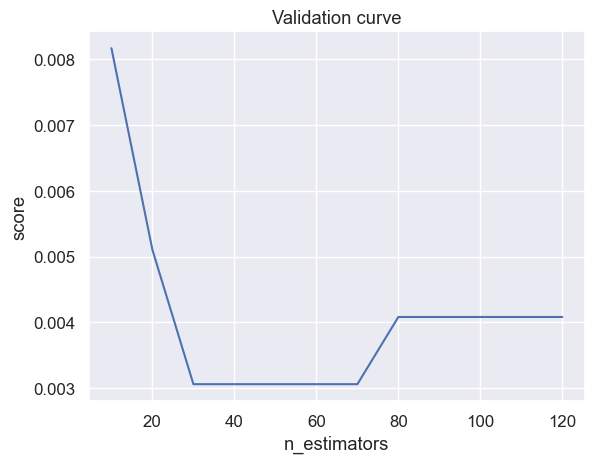

In [271]:
#валідаційна крива
validation_curve(model_grid, 'n_estimators')

Такий результат означає, що модель зовсім не передбачає нулі і це погано :(

## Бустинг

Побудуємо ансамблеву модель типу “бустинг”, взявши в якості базової моделі неглибоке дерево рішень.(за замовчуванням)

In [272]:
from sklearn.ensemble import AdaBoostClassifier
ab = AdaBoostClassifier(n_estimators=100, random_state=21)
ab.fit(X_train, y_train)

AdaBoostClassifier(n_estimators=100, random_state=21)

In [273]:
#якість моделі бустингу
y_pred = ab.predict(X_valid)

print(confusion_matrix(y_valid, y_pred))
print('Recall:', recall_score(y_valid, y_pred))
print('Balanced_accuracy', balanced_accuracy_score(y_valid, y_pred))

[[3987   27]
 [ 349   12]]
Recall: 0.0332409972299169
Balanced_accuracy 0.5132572699154069


Не дуже добрий результат. Подивимось, що буде, якщо підібрати гіперпараметр n_estimators

In [274]:
from sklearn.model_selection import GridSearchCV

param_grid = {'n_estimators': np.arange(10, 101, 10)}
model_grid = GridSearchCV(ab, param_grid, cv=5, scoring='recall', n_jobs=-1)
model_grid.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=AdaBoostClassifier(n_estimators=100, random_state=21),
             n_jobs=-1,
             param_grid={'n_estimators': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100])},
             scoring='recall')

In [276]:
#найкращі показники
print('Best hidden_layer_sizes:', model_grid.best_params_)
print('\nBest score:', model_grid.best_score_)

Best hidden_layer_sizes: {'n_estimators': 50}

Best score: 0.05211407639979069


In [277]:
#якість моделі при найкращих показниках
model_best = model_grid.best_estimator_
y_pred = model_best.predict(X_valid)

print(confusion_matrix(y_valid, y_pred))
print('Recall:', recall_score(y_valid, y_pred))
print('Balanced_accuracy', balanced_accuracy_score(y_valid, y_pred))

[[3992   22]
 [ 346   15]]
Recall: 0.04155124653739612
Balanced_accuracy 0.5180352146986931


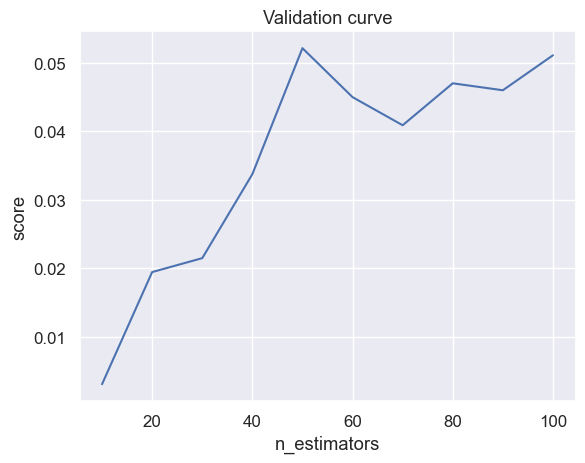

In [278]:
#валідаційна крива
validation_curve(model_grid, 'n_estimators')

Результат покращився, порівняно з попереднім

Спробуємо застосувати GradientBoostingClassifier

In [279]:
from sklearn.ensemble import GradientBoostingClassifier
gbc = GradientBoostingClassifier(random_state=12)
gbc.fit(X_train, y_train)
y_pred = gbc.predict(X_valid)

print(confusion_matrix(y_valid, y_pred))
print('Recall:', recall_score(y_valid, y_pred))
print('Balanced_accuracy', balanced_accuracy_score(y_valid, y_pred))

[[4006    8]
 [ 359    2]]
Recall: 0.00554016620498615
Balanced_accuracy 0.5017735708952186


Якість моделі спробуємо покращити підбором гіперпараметра n_estimators

In [280]:
from sklearn.model_selection import GridSearchCV

param_grid = {'n_estimators': np.arange(10, 101, 10)}
model_grid = GridSearchCV(gbc, param_grid, cv=5, scoring='recall', n_jobs=-1)
model_grid.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(random_state=12),
             n_jobs=-1,
             param_grid={'n_estimators': array([ 10,  20,  30,  40,  50,  60,  70,  80,  90, 100])},
             scoring='recall')

In [281]:
#найкращі показники
print('Best hidden_layer_sizes:', model_grid.best_params_)
print('\nBest score:', model_grid.best_score_)

Best hidden_layer_sizes: {'n_estimators': 100}

Best score: 0.019408686551543694


In [282]:
#якість моделі при найкращих показниках
model_best = model_grid.best_estimator_
y_pred = model_best.predict(X_valid)

print(confusion_matrix(y_valid, y_pred))
print('Recall:', recall_score(y_valid, y_pred))
print('Balanced_accuracy', balanced_accuracy_score(y_valid, y_pred))

[[4006    8]
 [ 359    2]]
Recall: 0.00554016620498615
Balanced_accuracy 0.5017735708952186


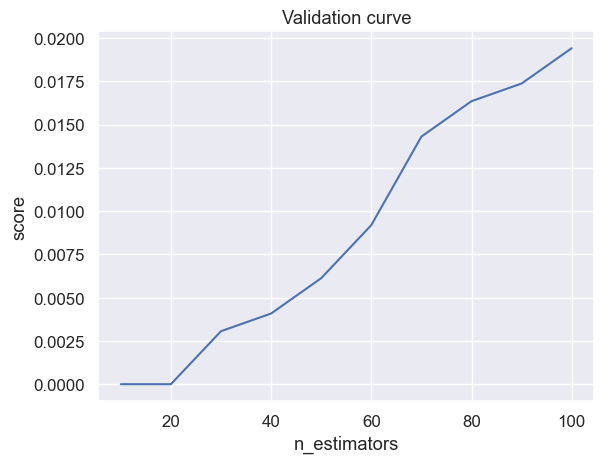

In [283]:
#валідаційна крива
validation_curve(model_grid, 'n_estimators')

Градієнтний бустинг дав гірші результати ніж звичаний і передбачення нулів дуже мале.

#  Дерева рішень

Навчимо алгоритм класифікації та оцінимо якість моделі на відкладеній вибірці

In [292]:
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(random_state=2019)

tree.fit(X_train, y_train)

y_pred = tree.predict(X_valid)

print(balanced_accuracy_score(y_valid, y_pred))

0.537532762754183


In [293]:
print(tree.tree_.max_depth)

30


Якість середня, спробуємо її покращити підбором гіперпараметрів

Створимо генератор розбиття, який перемішує вибірку перед створенням блоків

In [287]:
from sklearn.model_selection import KFold
kf = KFold(n_splits=5, shuffle=True, random_state=12)

## Підбір гіперпараметрів

Крос-валідація моделі для підбору гіперпараметрів:

1) максимальної глибини дерева --- max_depth
2) мінімальна кількість об’єктів для розбиття у внутішній вершині --- min_samples_split
3) мінімальна кількість об’єктів у листі --- min_samples_leaf
4) максимальна кількість ознак, що розглядаються при пошуку кращого розбиття --- max_features

In [288]:
from sklearn.model_selection import GridSearchCV
tree = DecisionTreeClassifier(random_state=12)
tree_grid = GridSearchCV(tree, {'max_depth': np.arange(3, 20), 'min_samples_split': np.arange(2, 11),'min_samples_leaf': np.arange(2, 11), 'max_features': np.arange(2, 11)}, cv=kf, scoring='balanced_accuracy', n_jobs=-1)

tree_grid.fit(X_train, y_train)

GridSearchCV(cv=KFold(n_splits=5, random_state=12, shuffle=True),
             estimator=DecisionTreeClassifier(random_state=12), n_jobs=-1,
             param_grid={'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]),
                         'max_features': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                         'min_samples_leaf': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                         'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10])},
             scoring='balanced_accuracy')

In [289]:
#найкращі показники
tree_grid.best_params_

{'max_depth': 16,
 'max_features': 8,
 'min_samples_leaf': 3,
 'min_samples_split': 8}

In [291]:
#якість моделі
model_best = tree_grid.best_estimator_
y_pred = model_best.predict(X_valid)

print(balanced_accuracy_score(y_valid, y_pred))

0.5337275215416403


Оптимальна максимальна глибина дерева дорівнює 18. Якість моделі трішки покращилась.

Підберемо один гіперпараметр максимальної глибини дерева

In [186]:
from sklearn.model_selection import GridSearchCV
tree = DecisionTreeClassifier(random_state=12)
tree_grid = GridSearchCV(tree, {'max_depth': np.arange(3, 20)}, cv=kf, scoring='balanced_accuracy', n_jobs=-1)

tree_grid.fit(X_train, y_train)
tree_grid.best_params_

{'max_depth': 18}

In [190]:
#якість моделі
model_best = tree_grid.best_estimator_
y_pred = model_best.predict(X_valid)

print(balanced_accuracy_score(y_valid, y_pred))

0.5419873931544305


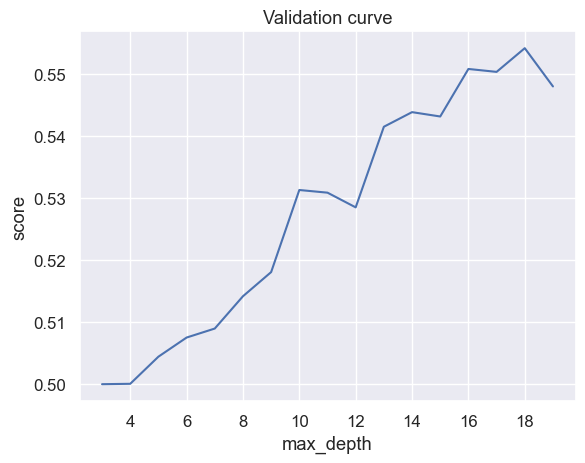

In [189]:
#валідаційна крива
validation_curve(tree_grid, 'max_depth', [i for i in range(3, 20)])

Отримали таку саму глибину

Підберемо один гіперпараметр min_samples_split

In [191]:
from sklearn.model_selection import GridSearchCV
tree = DecisionTreeClassifier(random_state=12)
tree_grid = GridSearchCV(tree, {'min_samples_split': np.arange(2, 50)}, cv=kf, scoring='balanced_accuracy', n_jobs=-1)

tree_grid.fit(X_train, y_train)
tree_grid.best_params_

{'min_samples_split': 2}

In [192]:
#якість моделі
model_best = tree_grid.best_estimator_
y_pred = model_best.predict(X_valid)

print(balanced_accuracy_score(y_valid, y_pred))

0.5435711850628064


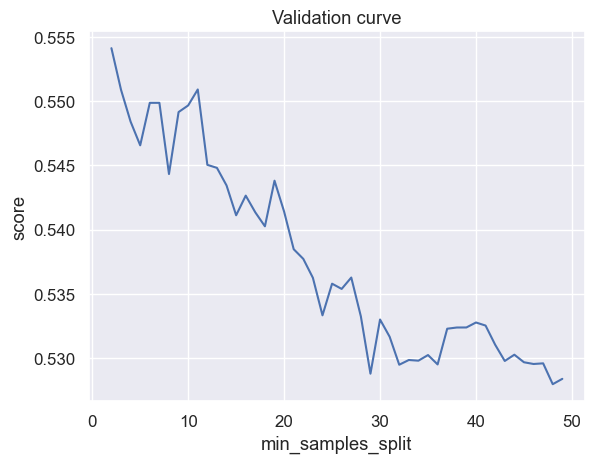

In [193]:
#валідаційна крива
validation_curve(tree_grid, 'min_samples_split', [i for i in range(2, 50)])

Підберемо гіперпараметр min_samples_leaf

In [197]:
from sklearn.model_selection import GridSearchCV
tree = DecisionTreeClassifier(random_state=12)
tree_grid = GridSearchCV(tree, {'min_samples_leaf': np.arange(2, 50)}, cv=kf, scoring='balanced_accuracy', n_jobs=-1)

tree_grid.fit(X_train, y_train)
tree_grid.best_params_

{'min_samples_leaf': 7}

In [195]:
#якість моделі
model_best = tree_grid.best_estimator_
y_pred = model_best.predict(X_valid)

print(balanced_accuracy_score(y_valid, y_pred))

0.5249338533967678


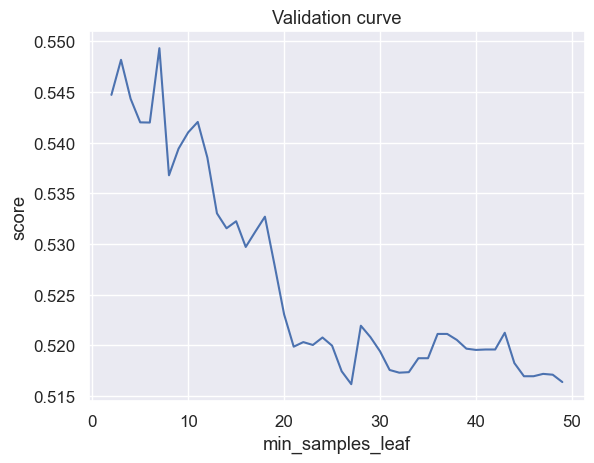

In [198]:
#валідаційна крива
validation_curve(tree_grid, 'min_samples_leaf', [i for i in range(2, 50)])

Підберемо гіперпараметр max_features

In [199]:
from sklearn.model_selection import GridSearchCV
tree = DecisionTreeClassifier(random_state=12)
tree_grid = GridSearchCV(tree, {'max_features': np.arange(2, 50)}, cv=kf, scoring='balanced_accuracy', n_jobs=-1)

tree_grid.fit(X_train, y_train)
tree_grid.best_params_

{'max_features': 21}

In [200]:
#якість моделі
model_best = tree_grid.best_estimator_
y_pred = model_best.predict(X_valid)

print(balanced_accuracy_score(y_valid, y_pred))

0.5513980155328925


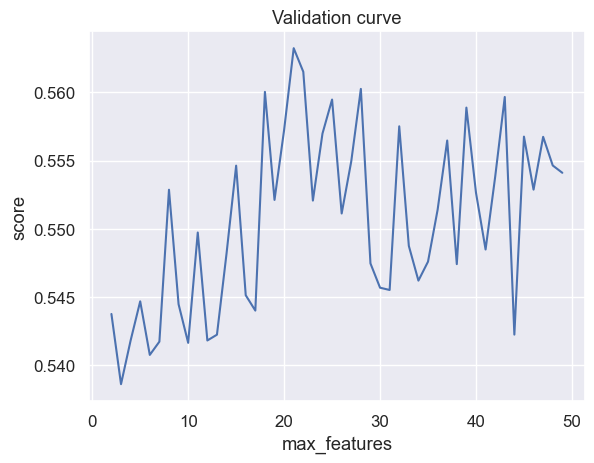

In [201]:
#валідаційна крива
validation_curve(tree_grid, 'max_features', [i for i in range(2, 50)])

Отже, отримали такі результати:
1) максимальної глибини дерева: 18
2) мінімальна кількість об’єктів для розбиття у внутішній вершині: 2
3) мінімальна кількість об’єктів у листі: 7
4) максимальна кількість ознак, що розглядаються при пошуку кращого розбиття: 21

Побудуємо отримане дерево

In [203]:
tree = DecisionTreeClassifier(random_state=12, max_depth=18)
tree.fit(X_train, y_train)
y_pred = tree.predict(X_valid)

print(balanced_accuracy_score(y_valid, y_pred))

0.5419873931544305


In [204]:
from sklearn.tree import export_graphviz
export_graphviz(tree, out_file='my_tree.dot', feature_names=X.columns)

In [205]:
print(open('my_tree.dot').read())

digraph Tree {
node [shape=box, fontname="helvetica"] ;
edge [fontname="helvetica"] ;
0 [label="lt <= 0.715\ngini = 0.138\nsamples = 13123\nvalue = [12144, 979]"] ;
1 [label="voice_in_uniq_count_m1 <= 4.5\ngini = 0.271\nsamples = 3506\nvalue = [2939, 567]"] ;
0 -> 1 [labeldistance=2.5, labelangle=45, headlabel="True"] ;
2 [label="balance_sum <= 0.963\ngini = 0.147\nsamples = 992\nvalue = [913, 79]"] ;
1 -> 2 ;
3 [label="data_type_3_m1 <= 0.458\ngini = 0.239\nsamples = 368\nvalue = [317, 51]"] ;
2 -> 3 ;
4 [label="com_num_cost_m1 <= 2.25\ngini = 0.136\nsamples = 231\nvalue = [214, 17]"] ;
3 -> 4 ;
5 [label="manufacturer_category <= 30.5\ngini = 0.115\nsamples = 228\nvalue = [214, 14]"] ;
4 -> 5 ;
6 [label="act_days_count_m3 <= 9.5\ngini = 0.5\nsamples = 2\nvalue = [1, 1]"] ;
5 -> 6 ;
7 [label="gini = 0.0\nsamples = 1\nvalue = [0, 1]"] ;
6 -> 7 ;
8 [label="gini = 0.0\nsamples = 1\nvalue = [1, 0]"] ;
6 -> 8 ;
9 [label="act_days_count_m1 <= 9.5\ngini = 0.108\nsamples = 226\nvalue = [213, 1

Так як дерево велике, то його погано видно, але його можна зберегти та подивитися окремо.

Оцінимо важливість ознак

In [206]:
feature_importances = pd.DataFrame({'feature': X.columns, 'importance': np.round(tree.feature_importances_, 3)}).sort_values('importance', ascending=False)
feature_importances

,feature,importance
4,lt,0.120
12,balance_sum,0.074
22,voice_in_uniq_count_m1,0.064
28,data_type_3_m1,0.053
6,days_exp,0.046
27,data_type_2_m1,0.041
44,short_out_calls_part_m3,0.040
18,paym_el_sum_m1,0.038
15,com_num_cost_m1,0.038
21,voice_out_uniq_count_m1,0.037


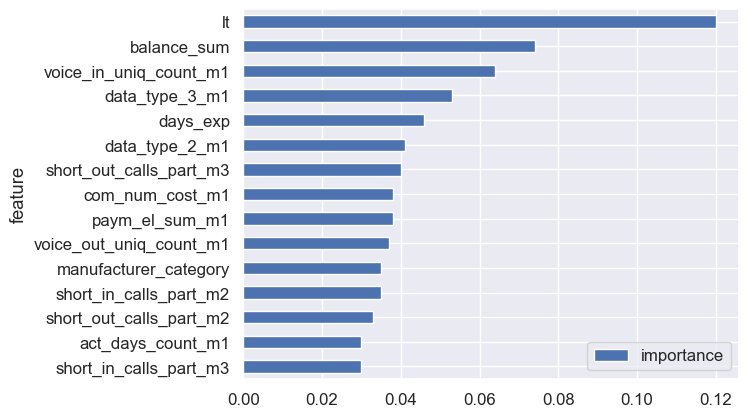

In [208]:
#графічне зобрадення важливості ознак
feature_importances.set_index('feature').head(15).sort_values('importance').plot(kind='barh')
plt.show()

Отже, "корінням" нашого дерева буде ознака lt (час життя клієнта)

# Ансамблі дерев

Побудуємо модель випадкового лісу з гіперпараметрами за замовчуванням

In [210]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=12)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_valid)

print(balanced_accuracy_score(y_valid, y_pred))

0.4998754359740907


Дивно, але якість такої моделі гірша за якість дерев рішень

## Підбір гіперпараметрів

Здійснимо підбір гіперпараметрів моделі:

1) кількості дерев n_estimators
2) максимальної глибини дерева max_depth
3) мінімальної кількісті об’єктів для розбиття у внутішній вершині min_samples_split
4) мінімальної кількісті об’єктів у листі min_samples_leaf
5) максимальної кількісті ознак, що розглядаються при пошуку кращого розбиття max_features

In [211]:
from sklearn.model_selection import RandomizedSearchCV
rf = RandomForestClassifier(random_state=12, n_jobs=-1)

rf_rand = RandomizedSearchCV(rf, {'n_estimators': np.arange(50, 501, 50), 'max_depth': np.arange(3, 15), 'max_features': np.arange(5, 21), 'min_samples_split': np.arange(2, 11), 'min_samples_leaf': np.arange(2, 11)}, cv=5, scoring='balanced_accuracy')
rf_rand.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=12),
                   param_distributions={'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                                        'max_features': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]),
                                        'min_samples_leaf': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'min_samples_split': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10]),
                                        'n_estimators': array([ 50, 100, 150, 200, 250, 300, 350, 400, 450, 500])},
                   scoring='balanced_accuracy')

In [212]:
rf_rand.best_params_

{'n_estimators': 100,
 'min_samples_split': 6,
 'min_samples_leaf': 8,
 'max_features': 17,
 'max_depth': 14}

In [213]:
rf_rand.best_score_

0.5005102040816326

In [214]:
best_rf = rf_rand.best_estimator_
y_pred = rf_rand.predict(X_valid)

print(balanced_accuracy_score(y_valid, y_pred))

0.5


Якість покращилась, але не більше ніж у дерев рішень

За отриманими даними можемо побудувати випадковий ліс з гіперпараметрами, які дають найкращу якість моделі.

In [329]:
rf = RandomForestClassifier(random_state=12, max_depth=14, n_estimators=100, min_samples_leaf=8, min_samples_split=6, max_features=17)
rf.fit(X_train, y_train)

y_pred = rf.predict(X_valid)

print(balanced_accuracy_score(y_valid, y_pred))

0.5


Оцінимо важливість ознак

In [330]:
importances = pd.DataFrame({'feature': X.columns, 'importance': np.round(rf.feature_importances_, 3)}).sort_values('importance', ascending=False)
importances

,feature,importance
4,lt,0.158
12,balance_sum,0.098
28,data_type_3_m1,0.057
22,voice_in_uniq_count_m1,0.048
27,data_type_2_m1,0.045
6,days_exp,0.042
20,short_out_calls_part_m1,0.038
15,com_num_cost_m1,0.036
44,short_out_calls_part_m3,0.033
16,conn_com_cost_m1,0.033


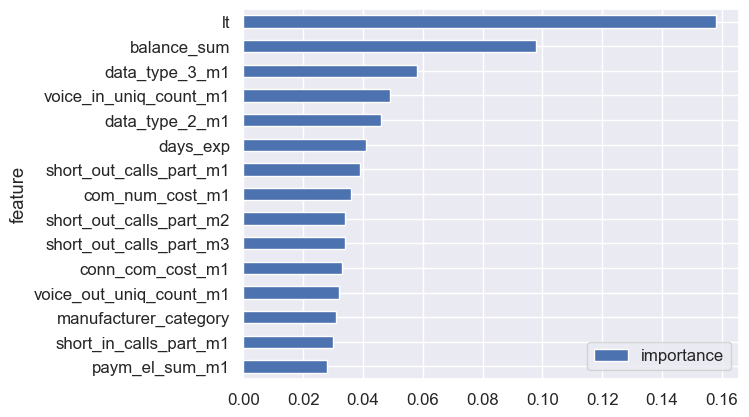

In [220]:
#графічне зобрадення важливості ознак
importances.set_index('feature').head(15).sort_values('importance').plot(kind='barh')
plt.show()

Бачимо, що найкращі ознаки за деревами рішень і ансамблямии дерев майже співпадають.
Найкращим результатом дерев рішень було 0.55, а ансамблів --- 0.5

# Висновок

Отримали такі результати моделей:
1) KNN --- balanced_accuracy = 0.53
2) Нейронні мережі --- balanced_accuracy = 0.58, recall = 0.22
3) Бегінг --- balanced_accuracy = 0.5, recall = 0.014
4) Бустинг --- balanced_accuracy = 0.52, recall = 0.04
5) Градієнтний бустинг --- balanced_accuracy = 0.5, recall = 0.006
6) Дерева рішкень --- balanced_accuracy = 0.55
7) Ансамблі дерев --- balanced_accuracy = 0.5

А отже, модель нейронних мереж є найкращою для передбачення, чи підпишуться користувачі на послугу Music.
А найїарактернішою ознакою, що впливає на передбачення є тривалість життя клієнта (lt) та баланс на початку місяця (balance_sum).